# Statistics of Objects

In this code, we prove via an example that traditional Statistics (Statistics of points) may lead to contradictory results when used for quantifying uncertainties in a sample of a random infinite-dimensional objects (curves, surfaces, volumes or hypervolumes)

Then, we calculate the Hausdorff Distance (HD) that measures the distance between two sets. Other distances (like L2) can be used and the result will be the same.

Finally, we use the concepts of Statistics of Objects, based on HD (Theory is detailed in the this link : https://www.lajss.org/index.php/LAJSS/article/view/5018/2693) to study two sets of random objects. Then we define for both : the median object, the 90%-quantile-object and the confidence interval at the same threshold, this one is not a "cuboid of R^n" but a subset of objects belonging to the initial sample !!

In my paper (cited above), three real applications are presented : two ones in Electrical Engineering (Van Der Pol oscillator and the Duffing oscillator) and another one in multiobjective optimization applied to Mechanics of Structures.

The same approach may be used in many other fields, where information is modeled with curves or surfaces. In Microeconomics: Utility, Production, Supply and Demand are all curves, and the Edgeworth box contains curves too, but this is only the case when the problem is deterministic. Once uncertainty is introduced, the curve becomes a batch of random curves...

In macroeconomics, the IS-LM curves are also good examples !

In [1]:
import numpy as np
import pandas as pd
import math
import datetime
import matplotlib.pyplot as plt

In [2]:
m = 200 # sample size
n = 100 # number of points

t = np.linspace(0,2*math.pi,n)
r = 5 + 5*np.random.rand(m)
a = 10*np.random.rand(m) - 5
b = 10*np.random.rand(m) - 5
alpha = 2*math.pi*np.random.rand(m)

#### We build the same set of random circles (same centers and same radius) in 4 different ways and we present the mean circle in each case, by using the pointwise mean of classical Statistics

In [3]:
x1 = np.zeros([m, n])
y1 = np.zeros([m, n])
for i in range(m):
    for j in range(n):
        x1[i, :] = r[i]*np.cos(t)
        y1[i, :] = r[i]*np.sin(t)

x1m = x1.mean(axis=0)
y1m = y1.mean(axis=0)

In [4]:
x2 = np.zeros([m, n])
y2 = np.zeros([m, n])
for i in range(m):
    for j in range(n):
        x2[i, j] = r[i]*np.cos(t[j]+alpha[i])
        y2[i, j] = r[i]*np.sin(t[j]+alpha[i])

x2m = x2.mean(axis=0)
y2m = y2.mean(axis=0)

In [5]:
x3 = np.zeros([m, n])
y3 = np.zeros([m, n])
for i in range(m):
    for j in range(n):
        x3[i, :] = r[i]*np.cos(t*(-1)**i)
        y3[i, :] = r[i]*np.sin(t*(-1)**i)
        
x3m = x3.mean(axis=0)
y3m = y3.mean(axis=0)

In [6]:
x4 = np.zeros([m, n])
y4 = np.zeros([m, n])
for i in range(m):
    for j in range(n):
        x4[i, j] = r[i]*np.cos((t[j]+alpha[i])*(-1)**i)
        y4[i, j] = r[i]*np.sin((t[j]+alpha[i])*(-1)**i)

x4m = x4.mean(axis=0)
y4m = y4.mean(axis=0)

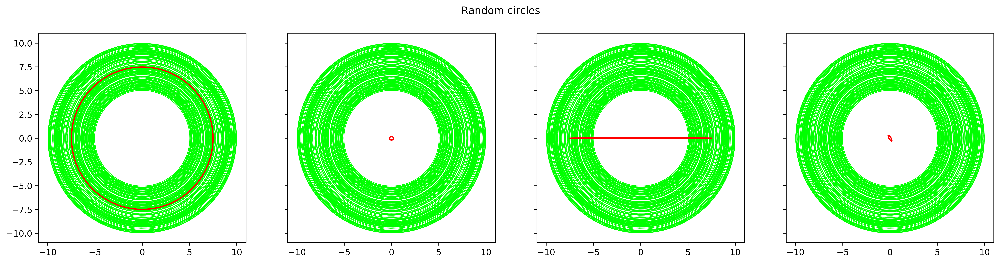

In [7]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, dpi=500, figsize=(20, 4.5))
fig.suptitle('Random circles')

for i in range(m):
    ax1.plot(x1[i,:],y1[i,:], linewidth=0.5, c='lime')
ax1.plot(x1m,y1m, linewidth=1.5, c='r')

for i in range(m):
    ax2.plot(x2[i,:],y2[i,:], linewidth=0.5, c='lime')
ax2.plot(x2m,y2m, linewidth=1.5, c='r')

for i in range(m):
    ax3.plot(x3[i,:],y3[i,:], linewidth=0.5, c='lime')
ax3.plot(x3m,y3m, linewidth=1.5, c='r')

for i in range(m):
    ax4.plot(x4[i,:],y4[i,:], linewidth=0.5, c='lime')
ax4.plot(x4m,y4m, linewidth=1.5, c='r')

for ax in fig.get_axes():
    ax.label_outer()

In Statistics, the mean is supposed to be the most representative value of a random variable, but in this example, the 3rd and 4th mean forms are not even circles and the second one can obviously not be representative of the set in question.
For the first one, the red circle may be accepted as a representative element of the whole set given the central position it occupies in it, but it is not a member of the family, it is outside the set!!

#### Now, let's build the function HD that computes the Hausdorff distance between 2 vectors with respective shapes (2,n1) and (2,n2). This function will be nested in a larger one that provides the HD between each couple of curves belonging to a set of random curves.

In [8]:
def stat_inf_obj(X,Y):
    
    def HD(C1,C2):
        n1 = len(C1.T)
        n2 = len(C2.T)
        D = np.zeros((n1,n2))
        for i in range(n1):
            for j in range(n2):
                D[i,j] = math.sqrt((C1[0,i]-C2[0,j])**2+(C1[1,i]-C2[1,j])**2)        
        D12 = max([min(D[i,:]) for i in range(n1)])
        D21 = max([min(D[:,j]) for j in range(n2)])
        return(max(D12,D21))
    
    m = len(X)
    h_dist = np.zeros((m,m))

    for r in range(m):
        
        h_dist[r,r] = 0
        for s in range(r+1,m):
            h_dist[r,s] = HD(np.asarray([X[r,:],Y[r,:]]),np.asarray([X[s,:],Y[s,:]]))
            h_dist[s,r] = h_dist[r,s]
    hd_min = np.argmin(np.sum(h_dist, axis=0))
    
    return(hd_min,h_dist)

In [9]:
x, y = x4, y4 # Let's take the "strangest" result .. the 4th one !

In [10]:
t0 = datetime.datetime.now()

hd_min, h_dist = stat_inf_obj(x,y)

# import multiprocessing

# if __name__ == '__main__':
#     jobs = []
#     for i in range(5):
#         p = multiprocessing.Process(target=stat_inf_obj, args=(x,y,))
#         jobs.append(p)
#         p.start()                          # I tried it but it doesn't work !!

t1 = datetime.datetime.now()

print("The median circle's index is : ",hd_min)

print(t1-t0)

The median circle's index is :  189
0:06:08.763820


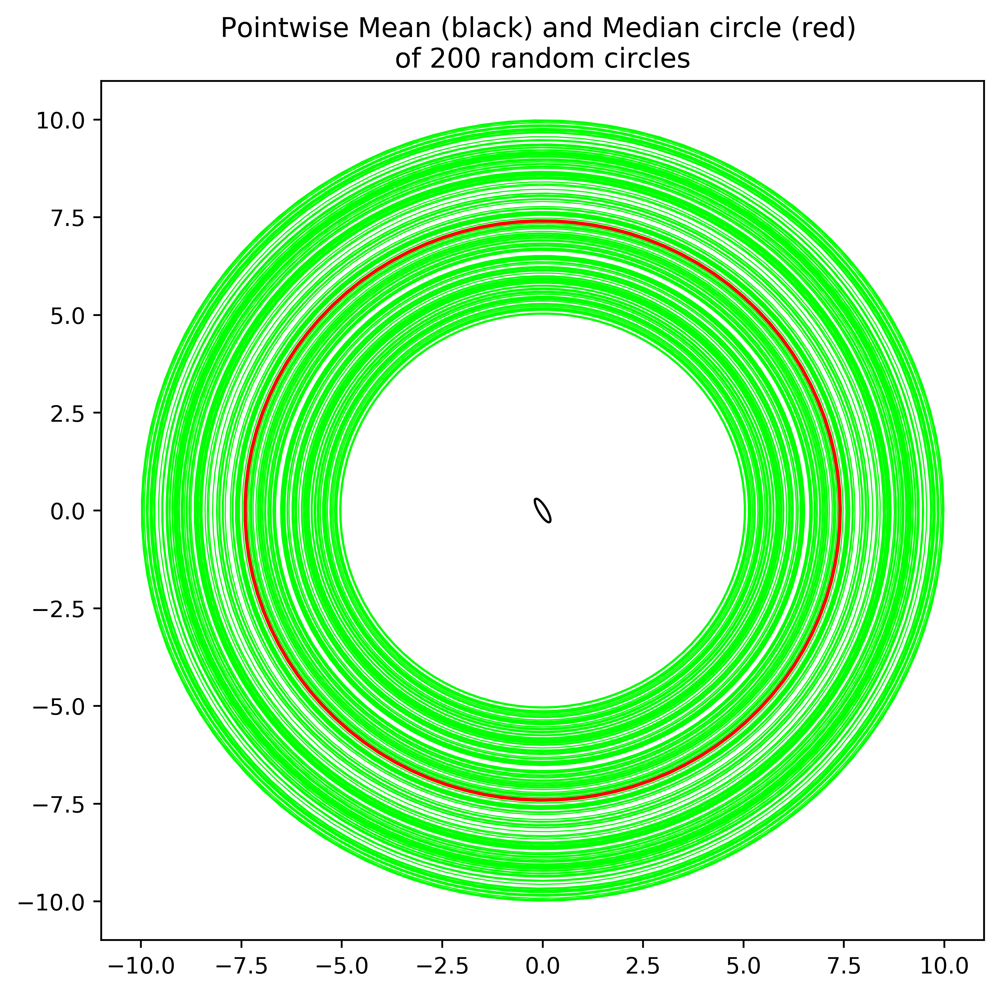

In [11]:
fig, ax = plt.subplots(figsize=(7,7), dpi=500)
ax.set_title('Pointwise Mean (black) and Median circle (red) \nof '+str(m)+' random circles')

for i in range(m):
    ax.plot(x[i,:],y[i,:], linewidth=0.5, c='lime')
ax.plot(x[hd_min,:],y[hd_min,:], linewidth=1.5, c='r')
ax.plot(x.mean(axis=0), y.mean(axis=0), linewidth=1, c='k')

Now, let's determine the 90%-quantile and the corresponding confidence interval, this one is made of 90% of the circles, and which are the closest ones to the median curve.

In [12]:
q = np.argsort(h_dist[hd_min,:]) # "q" for quantile 

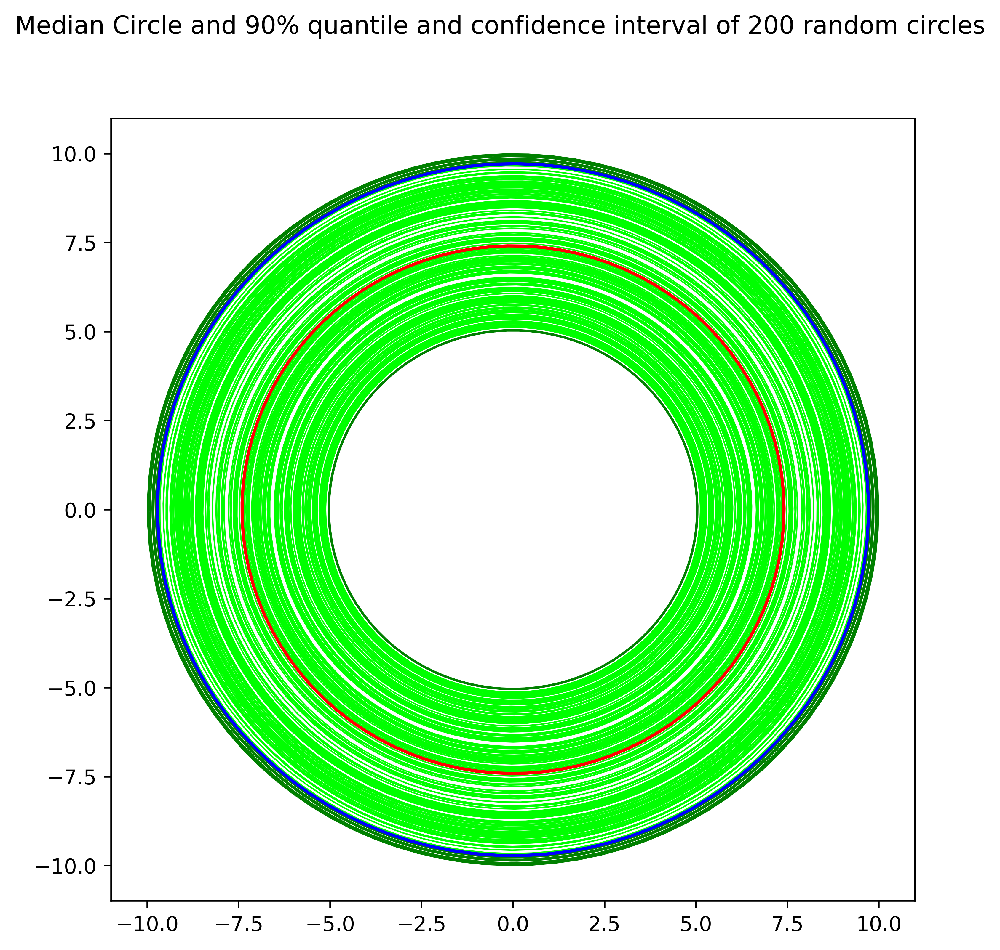

In [13]:
fig, ax = plt.subplots(figsize = (7,7),dpi=500)
fig.suptitle('Median Circle and 90% quantile and confidence interval of '+str(m)+' random circles')

for k in q[1:round(0.9*len(q))]:
    ax.plot(x[k,:],y[k,:], linewidth=0.7, c='lime')

for k in q[round(0.9*len(q)):len(q)]:
    ax.plot(x[k,:],y[k,:], linewidth=0.7, c='green')

ax.plot(x[q[round(0.9*len(q))],:],y[q[round(0.9*len(q))],:], linewidth=1.5, c='blue')
ax.plot(x[hd_min,:],y[hd_min,:], linewidth=1.5, c='r')

Sometimes, graphics related to Statics of objects may be confusing, for example, we expect the quantile to separate the confidence interval and the rest of the set and we find it in the other side of the median, and sometimes, we notice that some elements of the confidence interval intersect with the others. That's that the calculus is based on a measure that furnishes a distance between two sets and not between two points or between a point and a set. That's why we get some graphics that we can't interpret easily (see figures 12 and 13 in the cited article)

# A second example.

In [14]:
mm = 500
nn = round(n/(2*math.pi))
tt = np.linspace(0,1,nn)
rr = 5
a = 10*np.random.rand(mm) - 5
b = 10*np.random.rand(mm) - 5
alpha = 2*math.pi*np.random.rand(mm)

In [15]:
xx = np.zeros([mm, nn])
yy = np.zeros([mm, nn])

for i in range(mm):
    xx[i, :] = a[i] + rr*np.cos(tt+alpha[i])
    yy[i, :] = b[i] + rr*np.sin(tt+alpha[i])

xxm = xx.mean(axis=0)
yym = yy.mean(axis=0)

In [16]:
t0 = datetime.datetime.now()

hd_min2, h_dist2 = stat_inf_obj(xx,yy)

t1 = datetime.datetime.now()

print("The median arc's index is : ",hd_min2)

print(t1-t0)

The median arc's index is :  96
0:01:07.066024


In [17]:
q2 = np.argsort(h_dist2[hd_min2,:]) # "q" for quantile

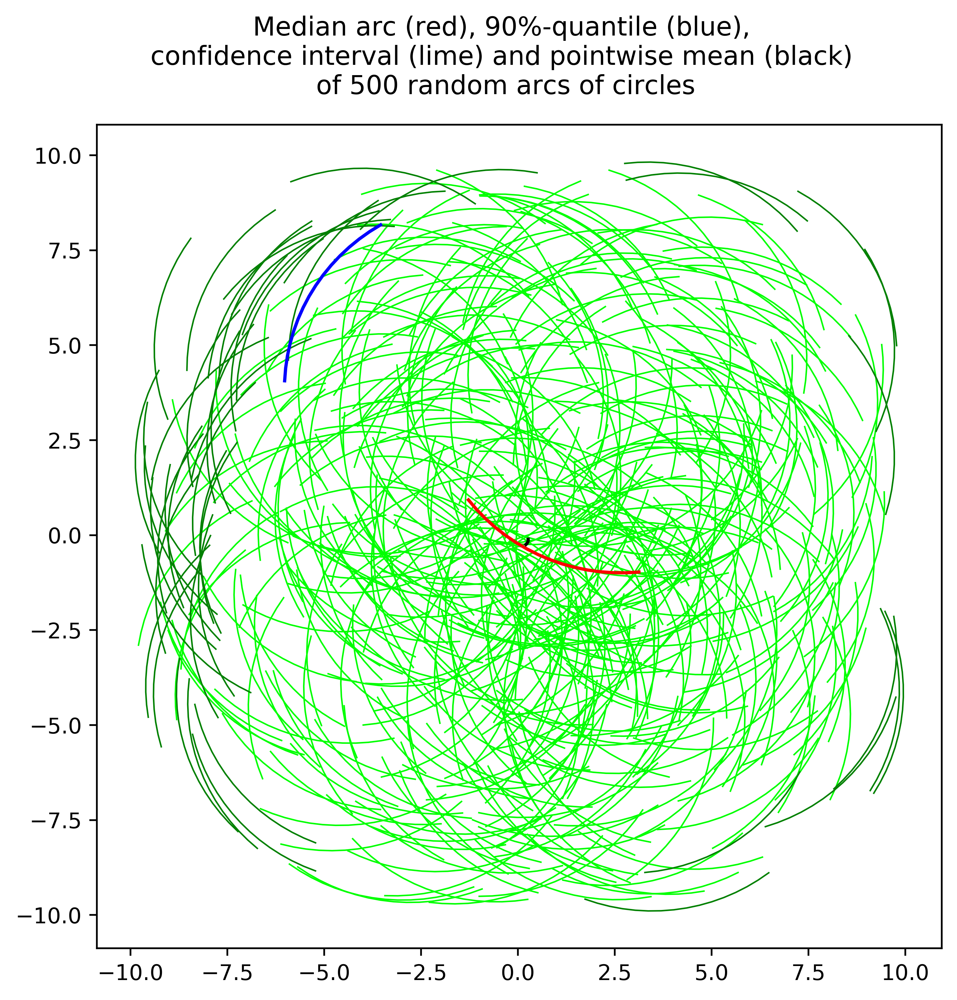

In [18]:
fig, ax = plt.subplots(figsize = (7,7),dpi=500)
fig.suptitle('Median arc (red), 90%-quantile (blue), \nconfidence interval (lime) and pointwise mean (black) \nof '+str(mm)+' random arcs of circles')

for k in q2[1:round(0.9*len(q2))]:
    ax.plot(xx[k,:],yy[k,:], linewidth=0.7, c='lime')

for k in q2[round(0.9*len(q2)):len(q2)]:
    ax.plot(xx[k,:],yy[k,:], linewidth=0.7, c='green')

ax.plot(xx[q2[round(0.9*len(q2))],:],yy[q2[round(0.9*len(q2))],:], linewidth=1.5, c='blue')
ax.plot(xx[hd_min2,:],yy[hd_min2,:], linewidth=1.5, c='r')
ax.plot(xxm,yym, linewidth=1.5, c='k')

#### In this example we can see how classical Statistics led to a pointwise mean (black) that cannot be representative of the whole set, while the red "median" belongs to this family of curves and occupies a central position in it.

# Statistics of Objects applied in Multiobjective Optimization under Uncertainty

#### This is an academic multiobjective optimization problem ... The original version is deterministic but here, we introduced uncertainty with two parameters and generate a 200 size sample of them, which gave us 200 deterministic problems via Monte Carlo Simulation, then, these problems led to 200 Pareto fronts (See figure below)

#### Binh & Korn is a MOO problem under constraints. For each value of epsilon1 and epsilon2 the problem has been solved with Matlab and the data has been imported in python with a CSV file.

In [19]:
f1_ubk = np.asarray(pd.read_csv('f1.csv', header=None)).T
f2_ubk = np.asarray(pd.read_csv('f2.csv', header=None)).T

In [20]:
l1 = len(f1_ubk)

t0 = datetime.datetime.now()

hd_min3, h_dist3 = stat_inf_obj(f1_ubk,f2_ubk)

t1 = datetime.datetime.now()

print("The median Praeto front's index is : ",hd_min3)

print(t1-t0)

The median Praeto front's index is :  108
0:08:29.725869


In [21]:
q3 = np.argsort(h_dist3[hd_min3,:]) # "q" for quantile

f1m = f1_ubk.mean(axis=0)
f2m = f2_ubk.mean(axis=0)

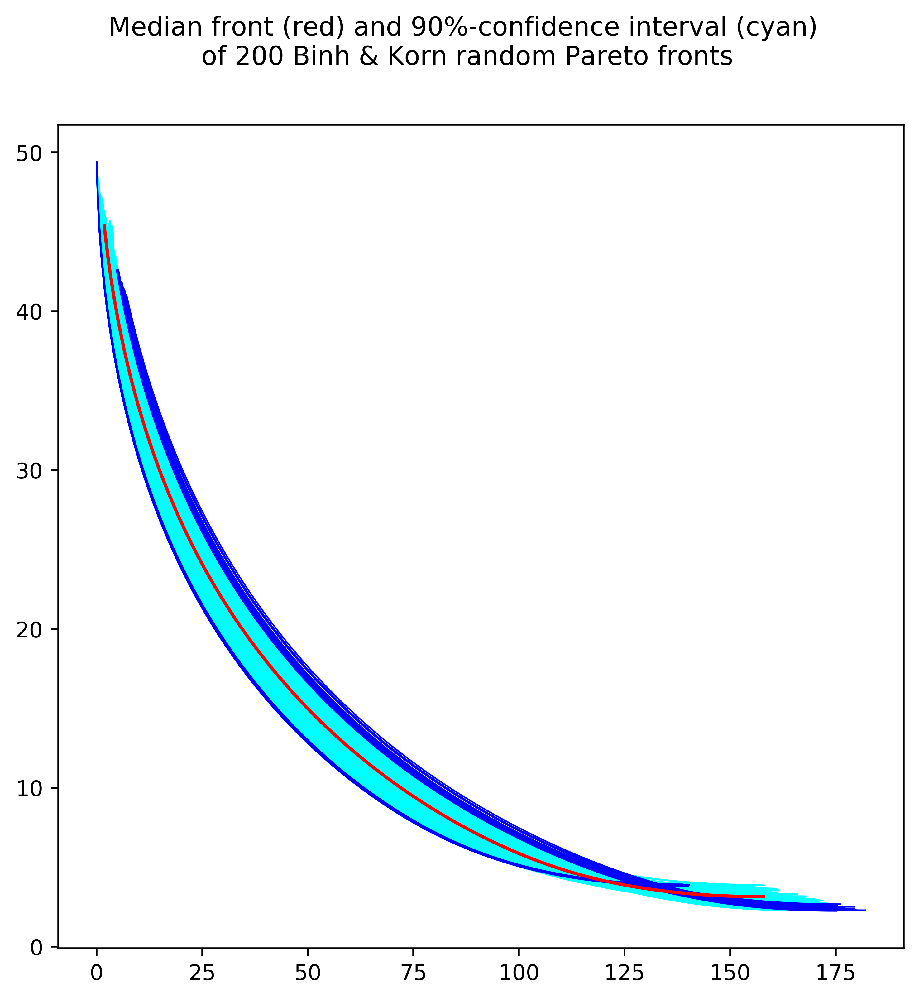

In [22]:
fig, ax = plt.subplots(figsize = (7,7),dpi=500)
fig.suptitle('Median front (red) and 90%-confidence interval (cyan) \nof '+str(l1)+' Binh & Korn random Pareto fronts')

for k in q3[1:round(0.9*len(q3))]:
    ax.plot(f1_ubk[k,:],f2_ubk[k,:], linewidth=0.7, c='cyan')

for k in q3[round(0.9*len(q3)):len(q3)]:
    ax.plot(f1_ubk[k,:],f2_ubk[k,:], linewidth=0.7, c='blue')

ax.plot(f1_ubk[q3[round(0.9*len(q3))],:],f2_ubk[q3[round(0.9*len(q3))],:], linewidth=1.5, c='blue')
ax.plot(f1_ubk[hd_min3,:],f2_ubk[hd_min3,:], linewidth=1.5, c='r')